In [1]:
import os
import glob
import time

import tensorflow
print(tensorflow.__version__)

import PIL
import numpy as np
import tensorflow as tf
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

2.9.0


In [71]:
! mkdir -p ./historys/generated_samples
! mkdir -p ./historys/training_checkpoints
! mkdir -p ./historys/training_history

! mkdir -p ./cgan_historys/generated_samples
! mkdir -p ./cgan_historys/training_checkpoints
! mkdir -p ./cgan_historys/training_history

# 데이터 로드

| Label | Description |
|:-----:|-------------|
|   0   | airplane    |
|   1   | automobile  |
|   2   | bird        |
|   3   | cat         |
|   4   | deer        |
|   5   | dog         |
|   6   | frog        |
|   7   | horse       |
|   8   | ship        |
|   9   | truck       |

In [15]:
cifar10 = tf.keras.datasets.cifar10
(train_x, train_y), (_, _) = cifar10.load_data()
train_x.shape

(50000, 32, 32, 3)

In [68]:
from tensorflow.keras.preprocessing import image

def display_sample_img(samples, grid, standard=False, size=1):
    h, w = grid
    n = np.cumprod(grid)[-1]
    plt.figure(figsize=(w*size,h*size))
    for i, sample in enumerate(samples[:n]):
        if i==n: break
        if standard:
            sample = ( sample  + 1. ) / 2.
        sample = np.clip(sample, 0, 1)
        plt.subplot(h,w,i+1)
        if sample.shape[-1]==1: plt.imshow(sample[:,:,0], cmap='gray_r')
        else: plt.imshow(sample)
        plt.xticks([]);plt.yticks([])
    plt.savefig(f'./historys/generated_samples/sample_epoch_{epoch:04d}_iter_{it:03d}.png')
    plt.show()

NameError: name 'epoch' is not defined

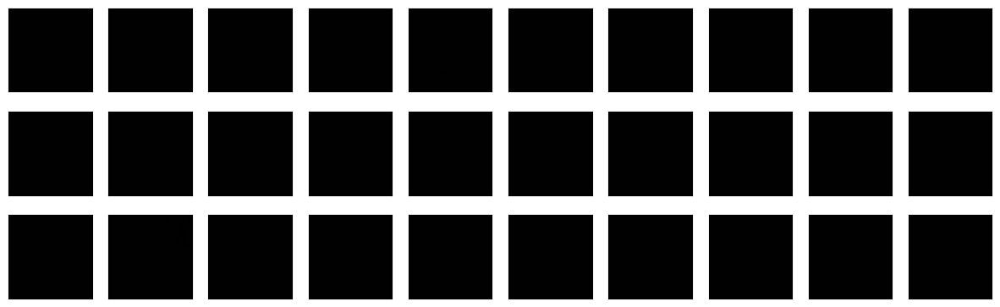

In [69]:
display_sample_img(train_x, (3,10), size=1.5)

In [7]:
train_x = (train_x - 127.5) / 127.5 # 이미지를 [-1, 1]로 정규화합니다.
print("data.shape", train_x.shape)
print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

data.shape (50000, 32, 32, 3)
max pixel: -0.9921568627450981
min pixel: -1.007843137254902


In [8]:
print("target.shape", train_y.shape)
print("category last:", train_y.max())
print("category first:", train_y.min())

target.shape (50000, 1)
category last: 9
category first: 0


In [43]:
BUFFER_SIZE = 1000
BATCH_SIZE = 32

label_dim = 10
latent_dim = 100

size=32
channels = 3

In [7]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# DCGAN

## Generator

In [9]:
def make_generator_model():

    # Start
    model = tf.keras.Sequential(name="generator")

    # First: Dense layer
    model.add(tf.keras.layers.Dense(8*8*128, use_bias=False, input_shape=(latent_dim,))) # 1차원
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    # Second: Reshape layer
    model.add(tf.keras.layers.Reshape((8,8,128))) # 2차원
    
    # Sixth: Conv2D layer
    model.add(tf.keras.layers.Conv2D(128, 5, padding='same'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    # Third: Conv2DTranspose layer
    model.add(tf.keras.layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer
    model.add(tf.keras.layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())


    # Sixth: Conv2D layer
    model.add(tf.keras.layers.Conv2D(128, 5, padding='same'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    
    # Seventh: Conv2D layer
    model.add(tf.keras.layers.Conv2D(3, 5, padding='same', activation="tanh"))
    return model

In [10]:
generator = make_generator_model()
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8192)              819200    
                                                                 
 batch_normalization (BatchN  (None, 8192)             32768     
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 8192)              0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 128)         0         
                                                                 
 conv2d (Conv2D)             (None, 8, 8, 128)         409728    
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 128)        512       
 hNormalization)                                         

In [11]:
noise = tf.random.normal([1, 100])

In [12]:
generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

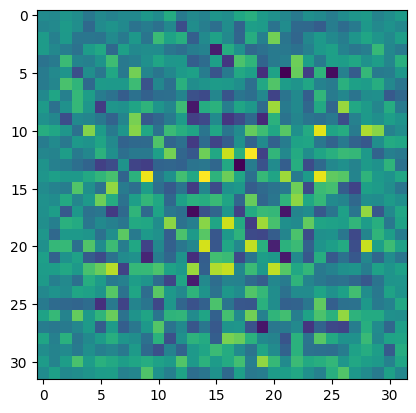

In [13]:
plt.imshow(generated_image[0, :, :, 0])
plt.show()

## Discriminator

In [14]:
def make_discriminator_model():

    # Start
    model = tf.keras.Sequential(name="discriminator")

    # First: Conv2D Layer
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    # Second: Conv2D Layer
    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    
    # Second: Conv2D Layer
    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    
    # Second: Conv2D Layer
    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    
    # Third: Flatten Layer
    model.add(tf.keras.layers.Flatten())

    # Fourth: Dense Layer
    model.add(tf.keras.layers.Dense(1, activation="sigmoid")) # find 0 or 1

    return model

In [15]:
discriminator = make_discriminator_model()

discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 16, 16, 64)        4864      
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 dropout (Dropout)           (None, 16, 16, 64)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 8, 8, 128)         204928    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 dropout_1 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 conv2d_5 (Conv2D)           (None, 4, 4, 128)       

In [16]:
decision = discriminator(generated_image, training=False) # 생성을 통한 학습만 진행
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.49979636]], dtype=float32)>

## Prepare train

In [16]:
bce = tf.keras.losses.BinaryCrossentropy()

def generator_loss(fake_output):
    return bce(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = bce(tf.ones_like(real_output), real_output)
    fake_loss = bce(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

In [18]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [19]:
noise_dim = 100
num_examples_to_generate = 25

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([25, 100])

In [23]:
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별 (0 or 1)
        real_output = discriminator(images, training=True) 
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

In [24]:
from tensorflow.keras.preprocessing import image

def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(8, 8))
    for i in range(predictions.shape[0]):
        plt.subplot(5, 5, i+1)
        img = image.array_to_img(predictions[i] * 127.5 + 127.5, scale=False)
        plt.imshow(img)
        plt.axis('off')
   
    plt.savefig(f'./historys/generated_samples/sample_epoch_{epoch:04d}_iter_{it:03d}.png')
    plt.show()

In [25]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.tight_layout()
    plt.savefig(f'./historys/training_history/train_history_{epoch:04d}.png')
    plt.show()

In [26]:
checkpoint_dir = './historys/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## train

In [27]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 100 == 0:
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))
        draw_train_history(history, epoch)

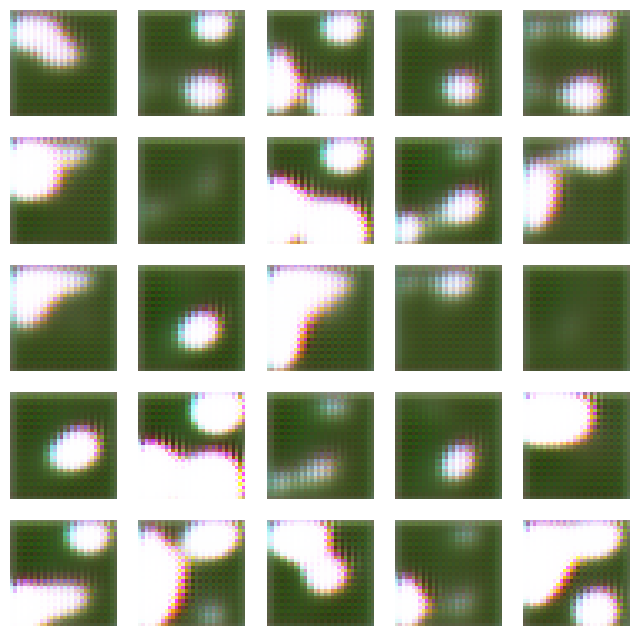

Time for training : 382 sec


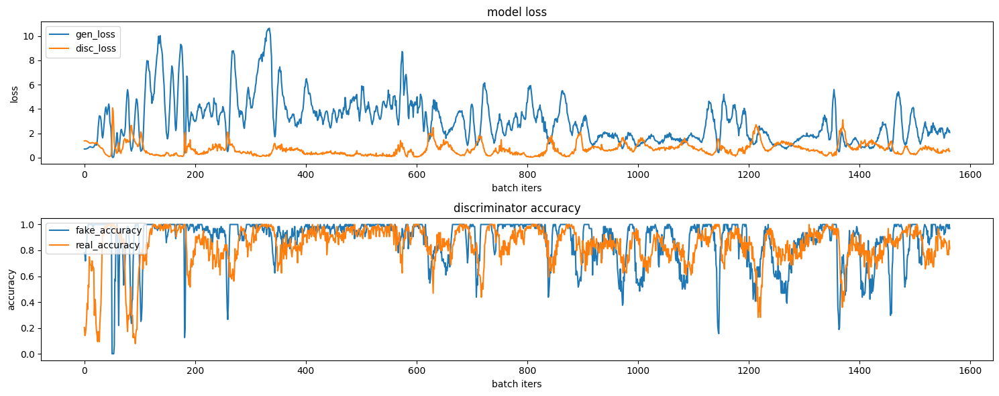

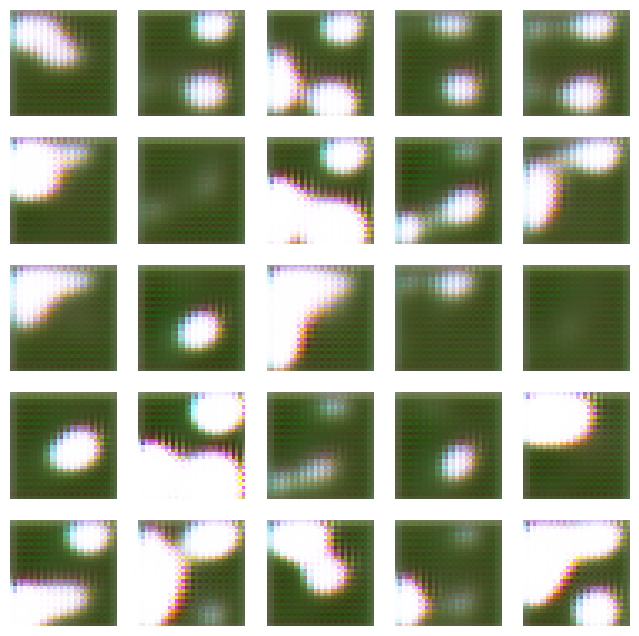

Epoch 3 | iter 1
Time for epoch 3 : 0 sec


KeyboardInterrupt: 

In [28]:
%%time
save_every = 5
EPOCHS = 50
train(train_dataset, EPOCHS, save_every)

# CGAN

In [11]:
import tensorflow as tf
from tensorflow.keras import models, layers, utils
import numpy as np
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical

In [4]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [1]:
def cifar10_loader(standard=False,onehot=False):
    (x_train,y_train), (x_test,y_test) = tf.keras.datasets.cifar10.load_data()
    x_train = x_train / 255.
    x_test = x_test / 255.
    if standard:
        x_train = (x_train * 2) - 1
        x_test = (x_test * 2) - 1
    if onehot:
        y_train = to_categorical(y_train, num_classes=10)
        y_test = to_categorical(y_test, num_classes=10)
    return x_train, y_train, x_test, y_test

In [5]:
class GAN():

    def __init__(self, gene, disc, img_shape, noise_dims, label_dims=None):
        self.name = 'GAN'
        self.gene = gene
        self.disc = disc
        self.img_shape = img_shape
        self.noise_dims = noise_dims
        self.label_dims=label_dims
        

    def Compile(self, loss='binary_crossentropy', optimizer='adam'):

        self.disc.compile(loss=loss, optimizer=optimizer)
        self.disc.trainable = False

        input_noise = layers.Input(shape=self.noise_dims)
        input_label = layers.Input(shape=self.label_dims)
        fake_img = self.gene([input_noise, input_label])
        logit = self.disc([fake_img, input_label])
        self.gan = models.Model([input_noise, input_label], logit, name=self.name)
        self.gan.compile(loss=loss, optimizer=optimizer)


    def _make_datasets(self, x_data, y_data=None):
        if self.label_dims:
            dataset = tf.data.Dataset.from_tensor_slices((x_data,y_data)).shuffle(1)
        else:
            dataset = tf.data.Dataset.from_tensor_slices(x_data).shuffle(1)
        dataset = dataset.batch(self.batch_size,drop_remainder=True).prefetch(1)
        return dataset

    def _make_constants(self):
        zeros = tf.constant([0.], shape=[self.batch_size, 1])
        ones = tf.constant([1.], shape=[self.batch_size, 1])
        return zeros, ones

    def _make_random(self):
        return tf.random.normal(shape=[self.batch_size, self.noise_dims])
    def _make_random_label(self):
        rnd_labels = np.random.randint(0, self.label_dims, self.batch_size)
        rnd_labels = utils.to_categorical(rnd_labels, self.label_dims)
        return rnd_labels

    def fit(self, x_data, y_data=None, epochs=1, batch_size=32, standard=False):

        # setting
        self.batch_size = batch_size
        if self.label_dims:
            train_ds = self._make_datasets(x_data, y_data)
            seed_noises = tf.random.normal(shape=[30, self.noise_dims])
            seed_labels =  np.tile(utils.to_categorical(np.arange(10), 10), (3,1))
        else:
            train_ds = self._make_datasets(x_data)
        zeros, ones = self._make_constants()

        # train
        history = {'d_loss': [], 'g_loss': []}
        for epoch in range(1 + epochs):
            if epoch > 0:
                for h in history:
                    history[h].append(0)
                

                for real_imgs , real_labels in train_ds:
                    # phase 1 - training the discriminator
                    fake_imgs = self.gene.predict_on_batch( [self._make_random(), real_labels ])

                    self.disc.trainable = True
                    d_loss_real = self.disc.train_on_batch([real_imgs, real_labels], ones)
                    d_loss_fake = self.disc.train_on_batch([fake_imgs, real_labels], zeros)
                    d_loss = (0.5 * d_loss_real) + (0.5 * d_loss_fake)

                    # phase 2 - training the generator
                    self.disc.trainable = False
                    g_loss = self.gan.train_on_batch([self._make_random(), self._make_random_label()], ones)

                    history['d_loss'][-1] += d_loss
                    history['g_loss'][-1] += g_loss

                # end 1 epoch
                print('* epoch: %i, d_loss: %f, g_loss: %f' %
                      (epoch, history['d_loss'][-1], history['g_loss'][-1]))
                fake_imgs = self.gene.predict([seed_noises, seed_labels])
                display_sample_img(fake_imgs, (3, 10), epoch=epoch,standard=standard, size=2)


In [18]:
class BuildModel():
    def __init__(self, img_shape, z_dim, label_dim=None):
        self.img_shape = img_shape
        self.z_dim = z_dim
        self.label_dim = label_dim

    def build_gene(self, activation = 'leaky_relu',last_activation='sigmoid', kernel_size=5):
        h, w, ch = self.img_shape
        z = layers.Input(shape=[self.z_dim,], name="noise")
        c = layers.Input(shape=[self.label_dim,], name='condition')
        y = layers.concatenate([z, c])
        y = layers.Dense(int(w/4)*int(h/4)*128)(y)
        y = layers.Reshape( [int(w/4),int(h/4),128] )(y)
        y = layers.BatchNormalization()(y)
        y = layers.Conv2DTranspose(64, kernel_size=kernel_size, padding='same', strides=1, activation=activation)(y)
        y = layers.BatchNormalization()(y)
        y = layers.Conv2DTranspose(32, kernel_size=kernel_size, padding='same', strides=2, activation=activation)(y)
        y = layers.BatchNormalization()(y)
        y = layers.Conv2DTranspose(ch, kernel_size=kernel_size, padding='same', strides=2, activation=last_activation)(y)
        model = models.Model([z, c], y, name='C_Generator')

        return model

    def build_disc(self,activation='leaky_relu',last_activation='sigmoid', kernel_size=5):
        h, w, ch = self.img_shape
        x = layers.Input(shape=self.img_shape, name='image')
        
        def _condition_vector(x):
            y = K.expand_dims(x, axis=1)
            y = K.expand_dims(y, axis=1)
            y = K.tile(y, [1, int(h/2), int(w/2), 1])
            return y
        
        y = layers.Conv2D(64, kernel_size=kernel_size, strides=2, padding='same', activation=activation)(x)
        in_c = layers.Input(shape= self.label_dim, name='condition')
        c = layers.Lambda(_condition_vector)(in_c)
        y = layers.concatenate([y, c], axis=3)

        y = layers.Dropout(.5)(y)
        y = layers.Conv2D(128, kernel_size=kernel_size, strides=2, padding='same', activation=activation)(y)
        y = layers.Dropout(.5)(y)
        y = layers.Conv2D(128, kernel_size=kernel_size, strides=2, padding='same', activation=activation)(y)
        y = layers.Dropout(.5)(y)
        y = layers.GlobalAveragePooling2D()(y)
        y = layers.Dense(64, activation="relu")(y)
        y = layers.Dense(1, activation=last_activation)(y)
        model = models.Model([x,in_c], y, name='C_Discriminator')

        return model

In [19]:
def display_sample_img(samples, grid, epoch, standard=False, size=1):
    h, w = grid
    n = np.cumprod(grid)[-1]
    plt.figure(figsize=(w*size,h*size))
    for i, sample in enumerate(samples[:n]):
        if i==n: break
        if standard:
            sample = ( sample  + 1. ) / 2.
        sample = np.clip(sample, 0, 1)
        plt.subplot(h,w,i+1)
        if sample.shape[-1]==1: plt.imshow(sample[:,:,0], cmap='gray_r')
        else: plt.imshow(sample)
        plt.xticks([]);plt.yticks([])
        plt.savefig(f'./cgan_historys/training_history/train_history_{epoch:03d}.png')
    plt.show()

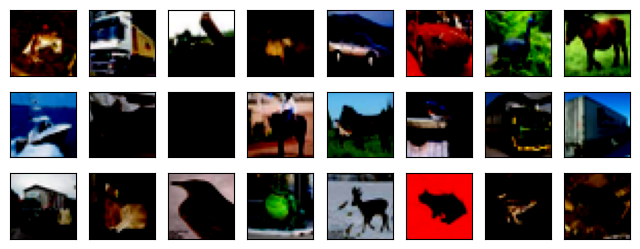

((50000, 32, 32, 3), (50000, 10), (10000, 32, 32, 3), (10000, 10))

In [20]:
IMG_SHAPE = (32,32,3)
NOISE_DIM = 128
LABEL_DIM = 10

x_train, y_train, x_test, y_test = cifar10_loader(True,True)
display_sample_img(x_train, (3,8), True)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

In [21]:
builder = BuildModel(IMG_SHAPE, NOISE_DIM, label_dim=10)
gene = builder.build_gene(last_activation='tanh') # tanh : -1 ~ 1 아웃풋  sigmoid: 0~1 아웃풋
disc = builder.build_disc()
gene.summary()
disc.summary()

Model: "C_Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 noise (InputLayer)             [(None, 128)]        0           []                               
                                                                                                  
 condition (InputLayer)         [(None, 10)]         0           []                               
                                                                                                  
 concatenate_4 (Concatenate)    (None, 138)          0           ['noise[0][0]',                  
                                                                  'condition[0][0]']              
                                                                                                  
 dense_6 (Dense)                (None, 8192)         1138688     ['concatenate_4[0][0]']

Model: "GAN"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128)]        0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 10)]         0           []                               
                                                                                                  
 C_Generator (Functional)       (None, 32, 32, 3)    1398083     ['input_1[0][0]',                
                                                                  'input_2[0][0]']                
                                                                                                  
 C_Discriminator (Functional)   (None, 1)            659841      ['C_Generator[0][0]',          

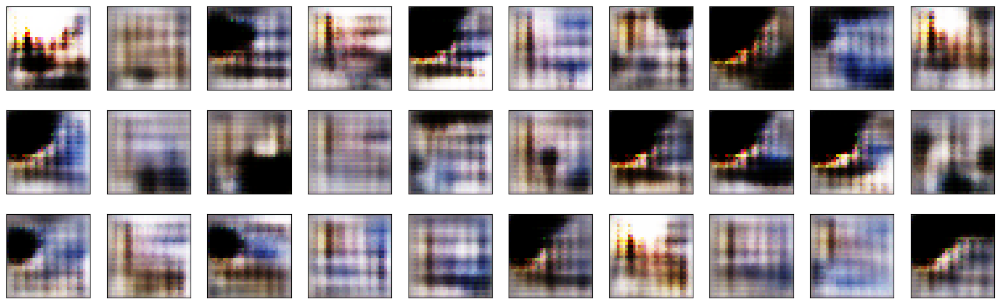

* epoch: 2, d_loss: 340.579272, g_loss: 5440.811668
1/1 [==============================] - 0s 13ms/step


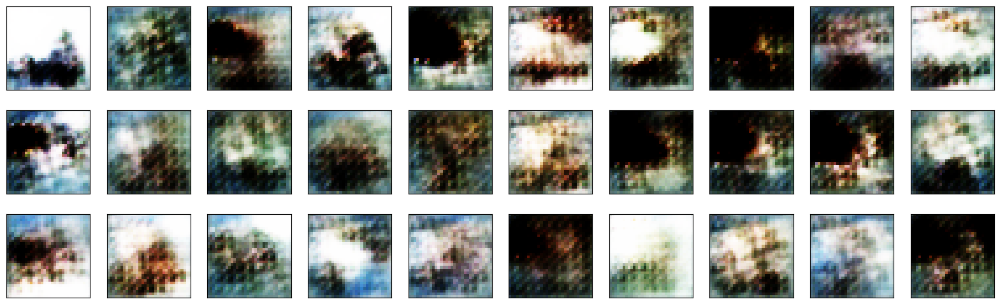

* epoch: 3, d_loss: 382.605795, g_loss: 5160.424007
1/1 [==============================] - 0s 17ms/step


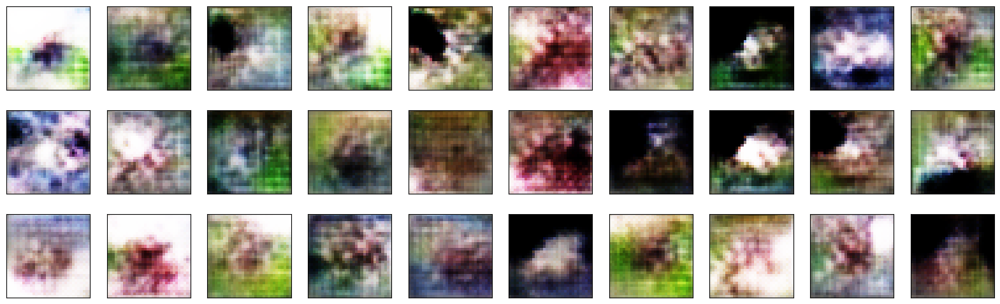

* epoch: 4, d_loss: 386.312327, g_loss: 5048.438667
1/1 [==============================] - 0s 12ms/step


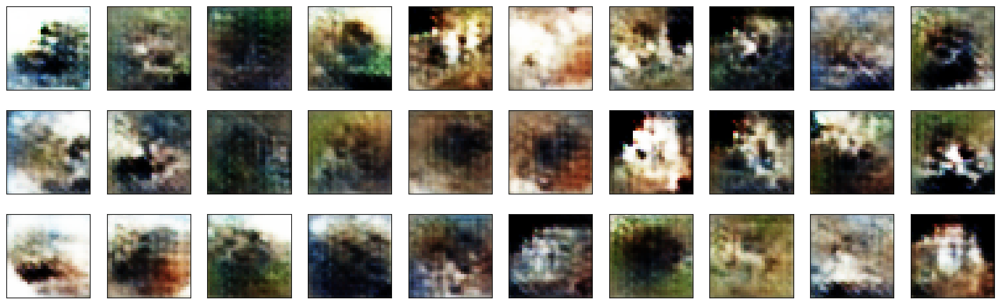

* epoch: 5, d_loss: 380.140822, g_loss: 4905.397764
1/1 [==============================] - 0s 12ms/step


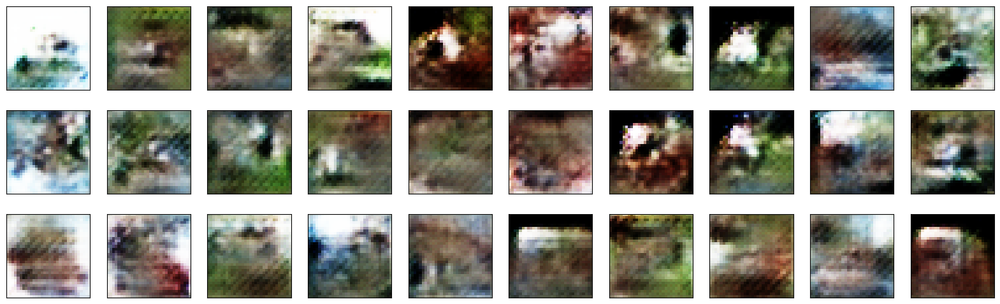

* epoch: 6, d_loss: 419.569804, g_loss: 4648.428215
1/1 [==============================] - 0s 13ms/step


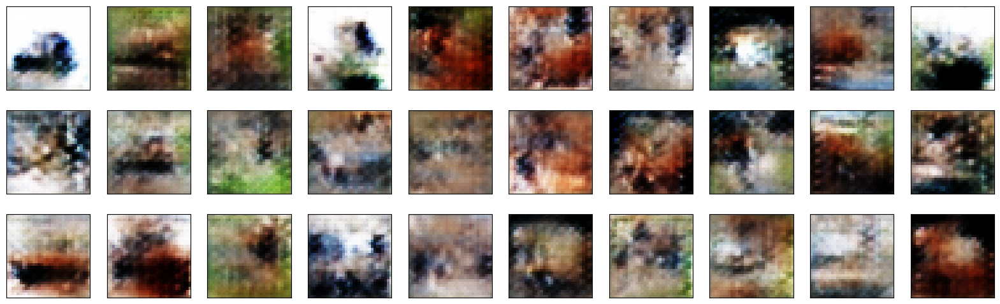

* epoch: 7, d_loss: 450.080650, g_loss: 4298.600608
1/1 [==============================] - 0s 12ms/step


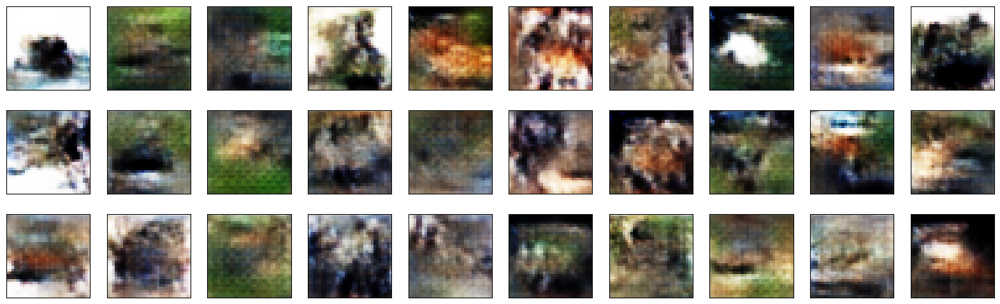

* epoch: 8, d_loss: 495.061645, g_loss: 3921.812537
1/1 [==============================] - 0s 13ms/step


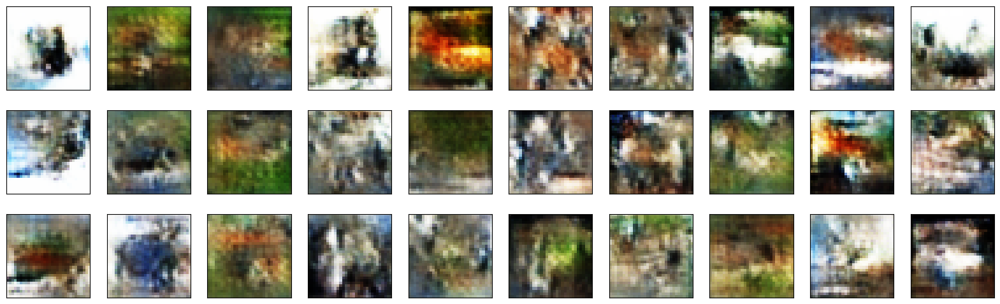

* epoch: 9, d_loss: 497.533754, g_loss: 3890.053368
1/1 [==============================] - 0s 12ms/step


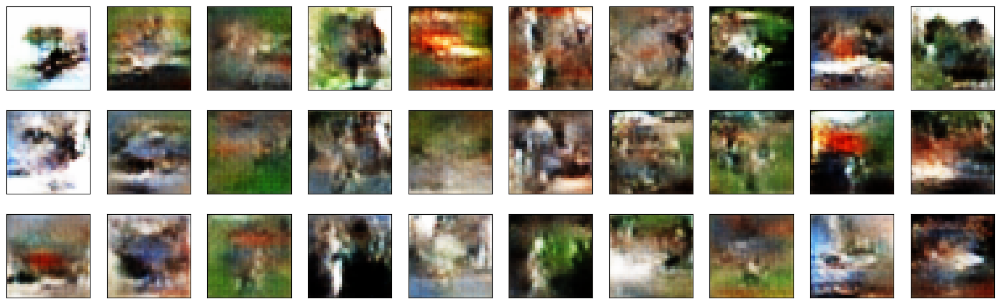

* epoch: 10, d_loss: 520.346974, g_loss: 3695.301670
1/1 [==============================] - 0s 13ms/step


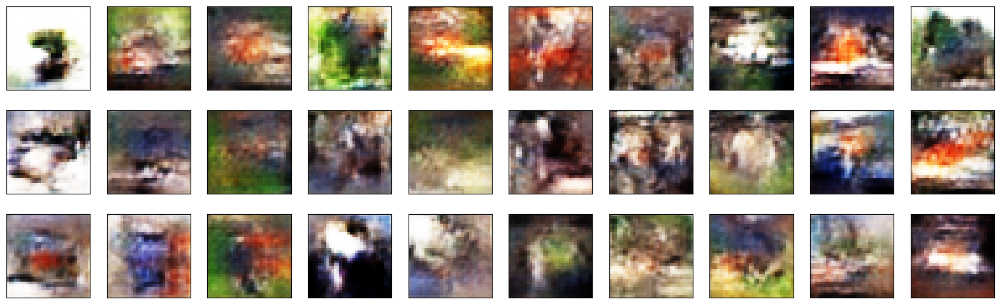

* epoch: 11, d_loss: 531.034469, g_loss: 3629.772710
1/1 [==============================] - 0s 13ms/step


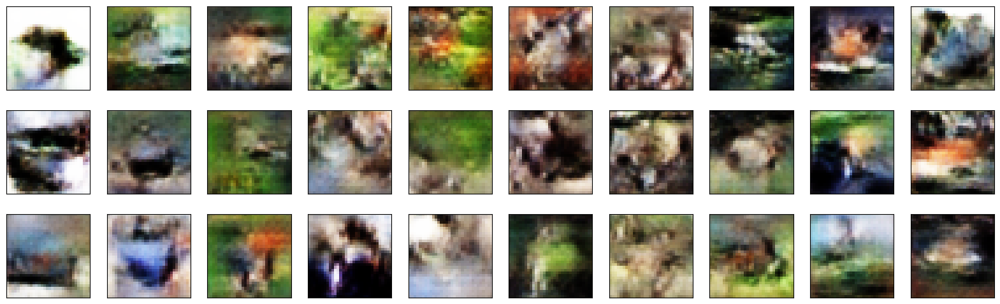

* epoch: 12, d_loss: 537.860947, g_loss: 3613.811818
1/1 [==============================] - 0s 14ms/step


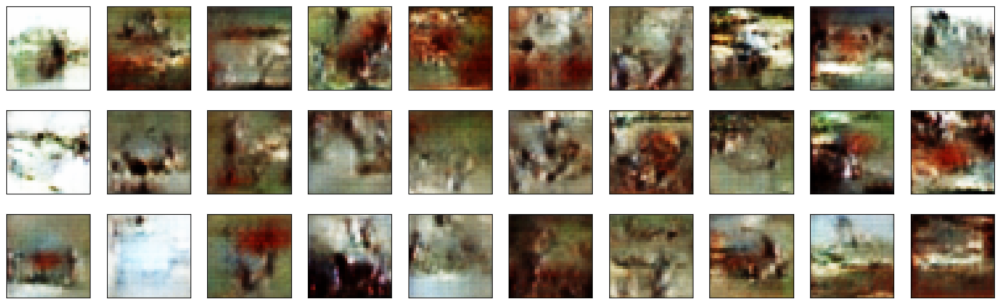

* epoch: 13, d_loss: 524.468917, g_loss: 3596.849848
1/1 [==============================] - 0s 14ms/step


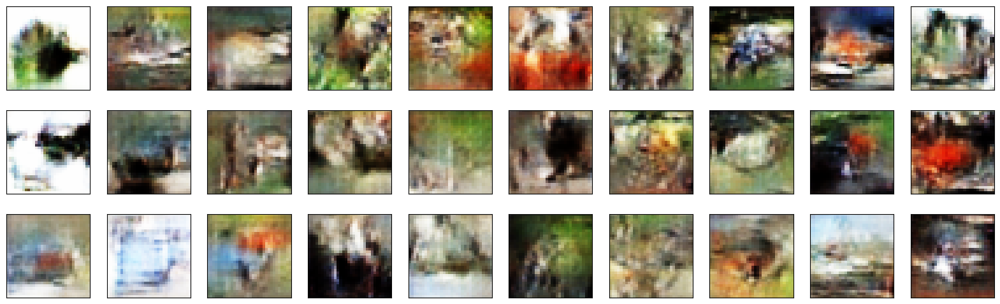

* epoch: 14, d_loss: 541.679587, g_loss: 3536.959668
1/1 [==============================] - 0s 16ms/step


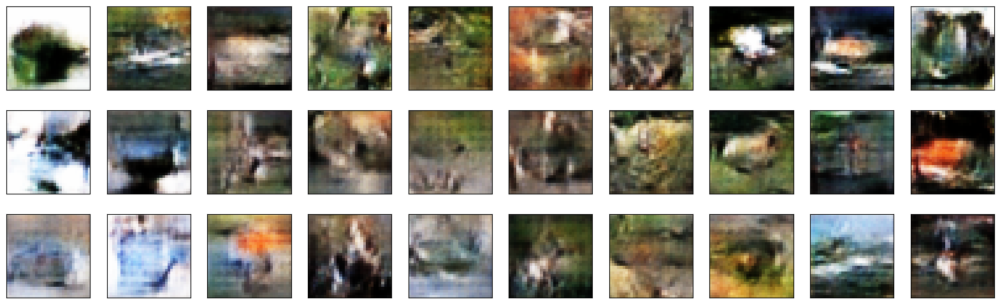

* epoch: 15, d_loss: 524.795659, g_loss: 3656.770925
1/1 [==============================] - 0s 15ms/step


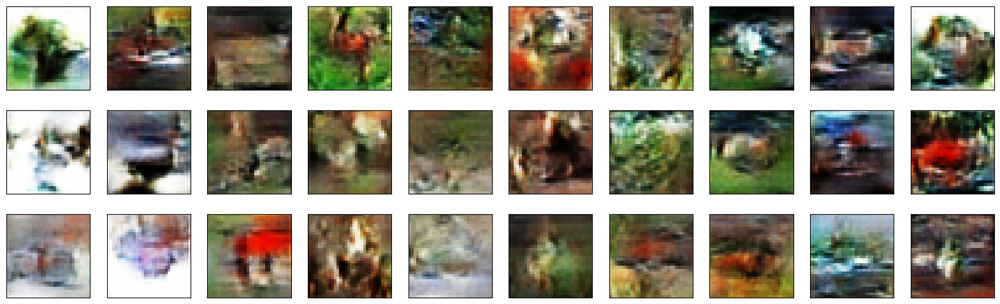

* epoch: 16, d_loss: 506.243284, g_loss: 3756.702301
1/1 [==============================] - 0s 16ms/step


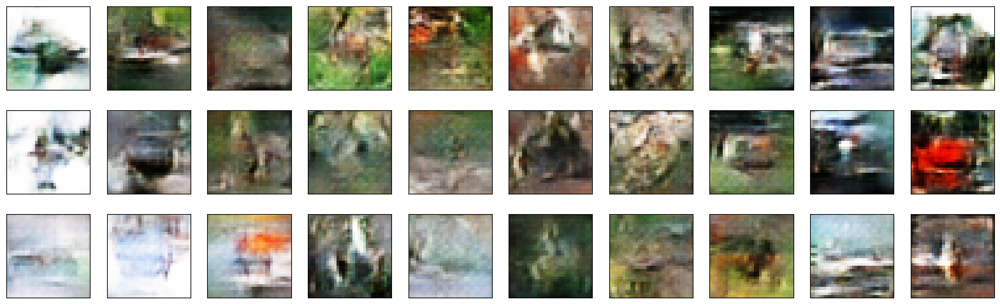

* epoch: 17, d_loss: 512.761890, g_loss: 3757.708686
1/1 [==============================] - 0s 16ms/step


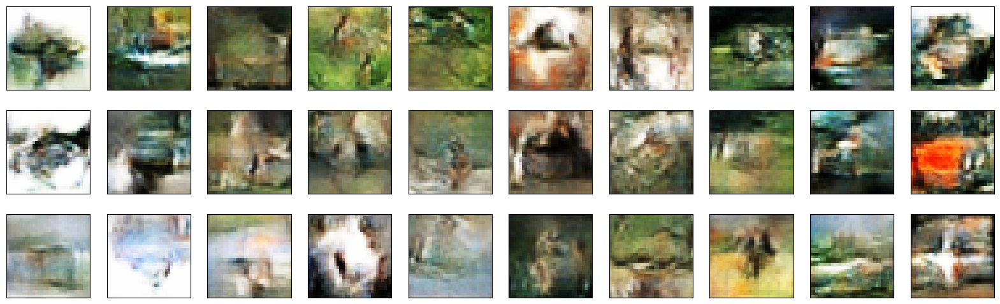

* epoch: 18, d_loss: 500.216844, g_loss: 3799.809904
1/1 [==============================] - 0s 17ms/step


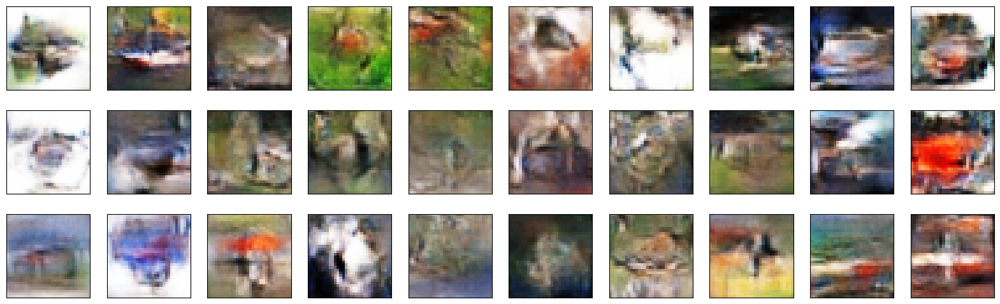

* epoch: 19, d_loss: 515.562165, g_loss: 3766.344241
1/1 [==============================] - 0s 15ms/step


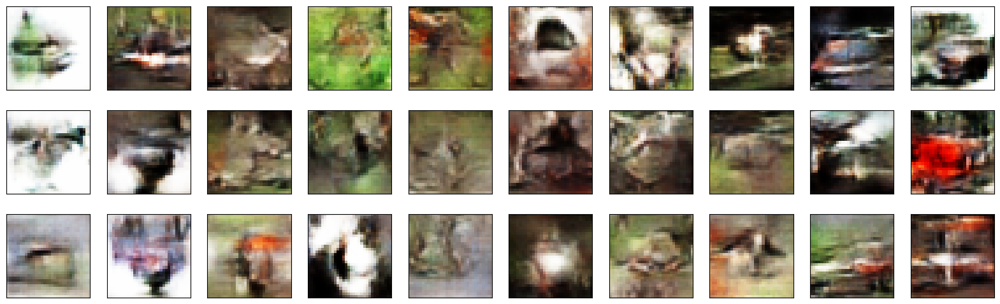

* epoch: 20, d_loss: 512.562220, g_loss: 3731.238539
1/1 [==============================] - 0s 16ms/step


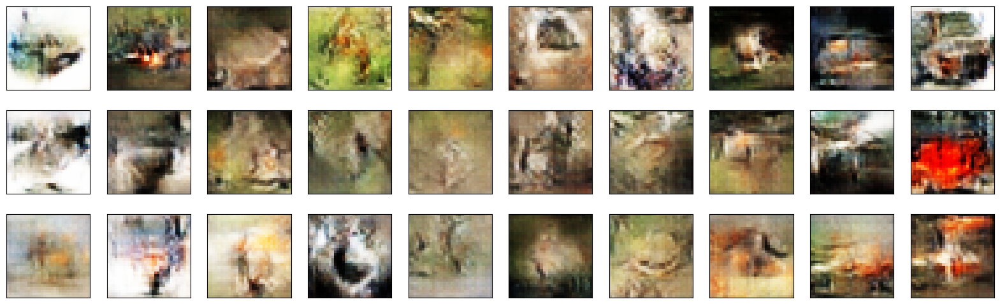

* epoch: 21, d_loss: 516.596199, g_loss: 3718.211571
1/1 [==============================] - 0s 15ms/step


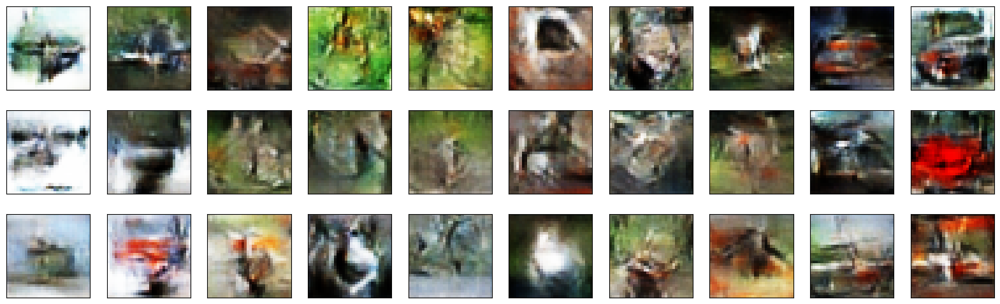

* epoch: 22, d_loss: 516.717710, g_loss: 3676.692084
1/1 [==============================] - 0s 16ms/step


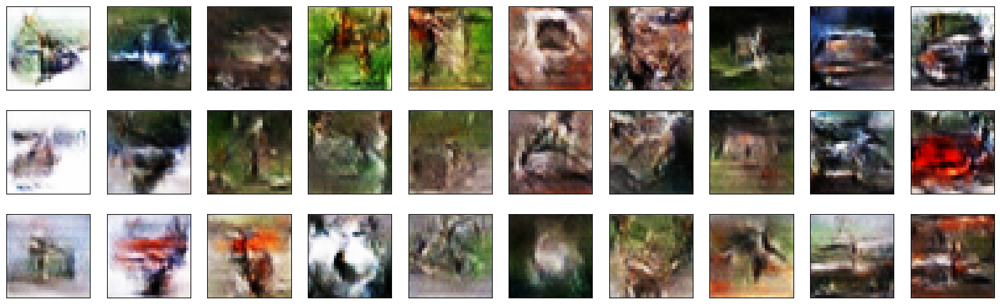

* epoch: 23, d_loss: 510.135408, g_loss: 3733.030415
1/1 [==============================] - 0s 15ms/step


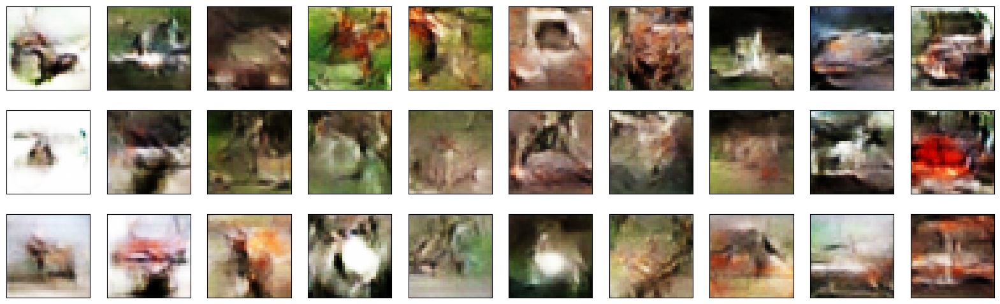

* epoch: 24, d_loss: 533.927077, g_loss: 3589.906705
1/1 [==============================] - 0s 16ms/step


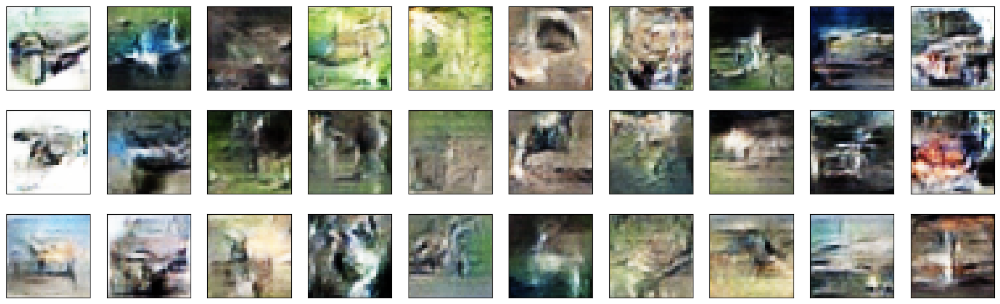

* epoch: 25, d_loss: 529.724825, g_loss: 3606.657569
1/1 [==============================] - 0s 15ms/step


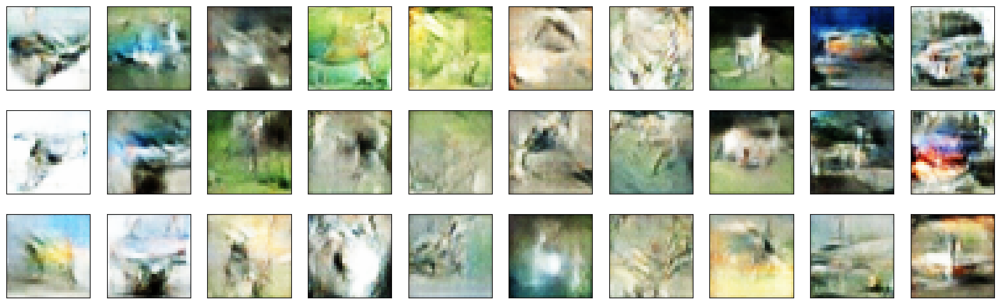

* epoch: 26, d_loss: 536.464899, g_loss: 3522.280797
1/1 [==============================] - 0s 17ms/step


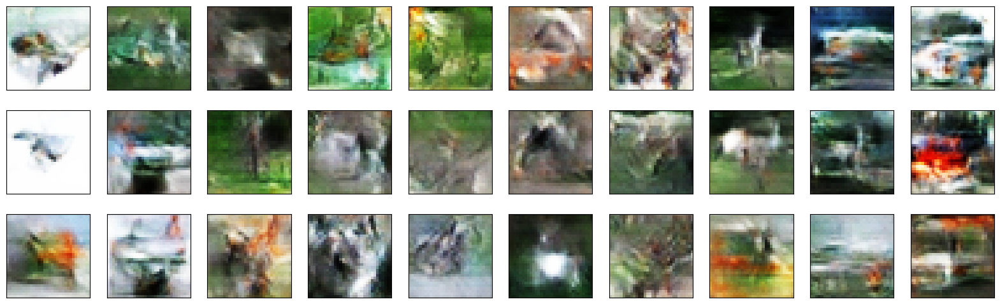

* epoch: 27, d_loss: 550.652785, g_loss: 3438.847487
1/1 [==============================] - 0s 17ms/step


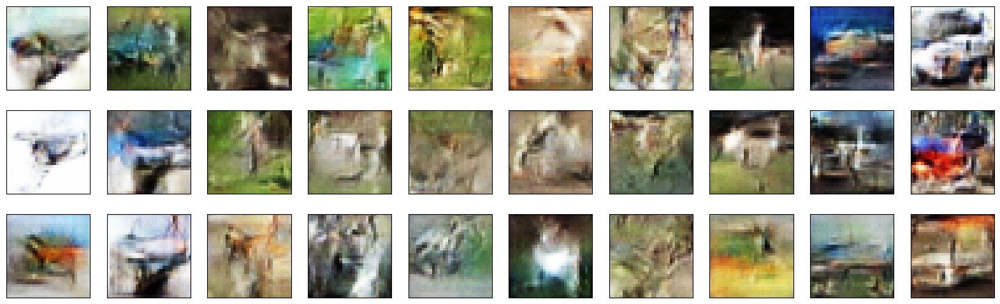

* epoch: 28, d_loss: 549.274195, g_loss: 3457.573843
1/1 [==============================] - 0s 15ms/step


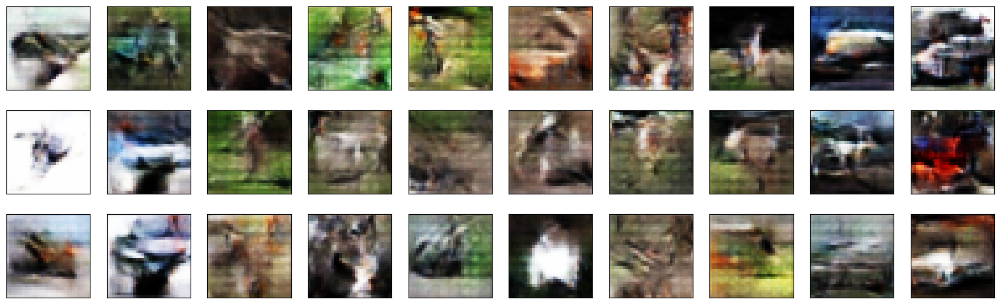

* epoch: 29, d_loss: 568.256911, g_loss: 3351.269501
1/1 [==============================] - 0s 17ms/step


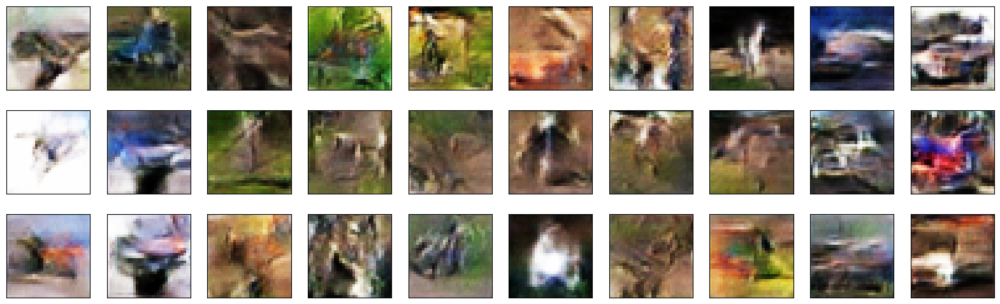

* epoch: 30, d_loss: 556.222467, g_loss: 3416.474428
1/1 [==============================] - 0s 17ms/step


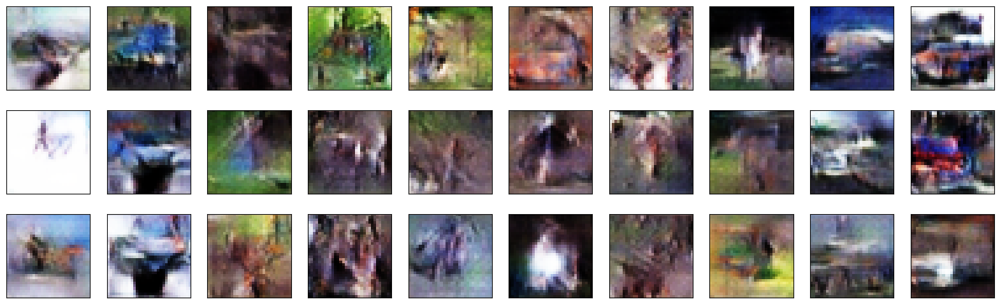

* epoch: 31, d_loss: 573.181144, g_loss: 3267.141795
1/1 [==============================] - 0s 16ms/step


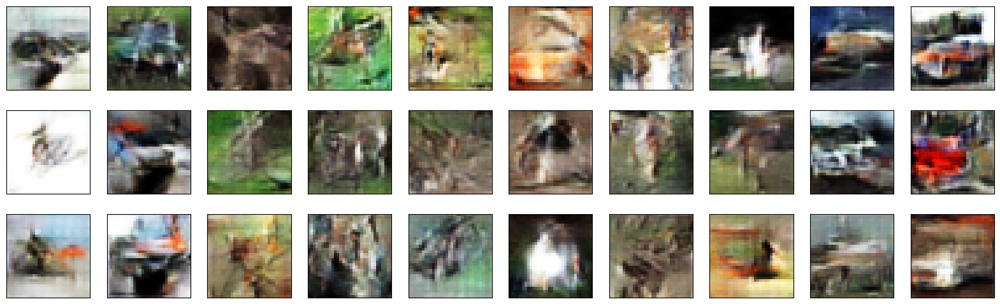

* epoch: 32, d_loss: 574.449186, g_loss: 3294.809614
1/1 [==============================] - 0s 16ms/step


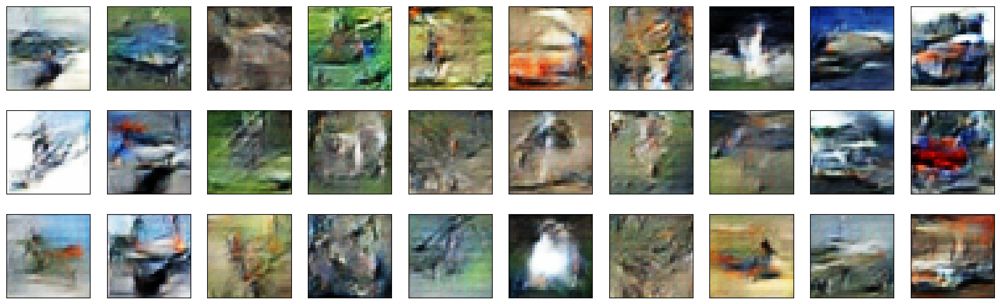

* epoch: 33, d_loss: 555.988730, g_loss: 3418.814542
1/1 [==============================] - 0s 18ms/step


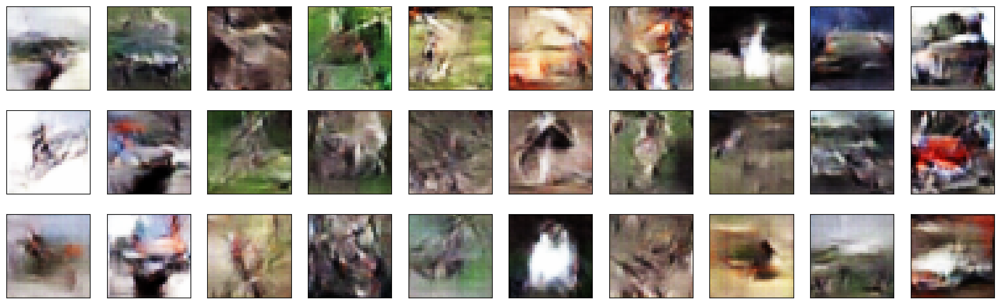

* epoch: 34, d_loss: 578.524081, g_loss: 3258.136756
1/1 [==============================] - 0s 16ms/step


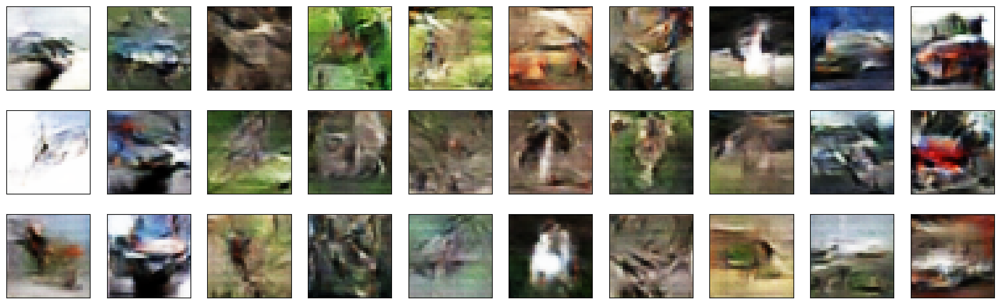

* epoch: 35, d_loss: 564.992115, g_loss: 3404.018467
1/1 [==============================] - 0s 16ms/step


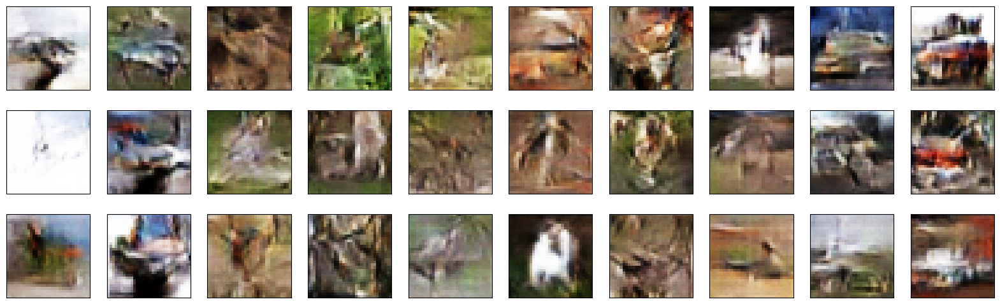

* epoch: 36, d_loss: 585.611284, g_loss: 3263.473288
1/1 [==============================] - 0s 20ms/step


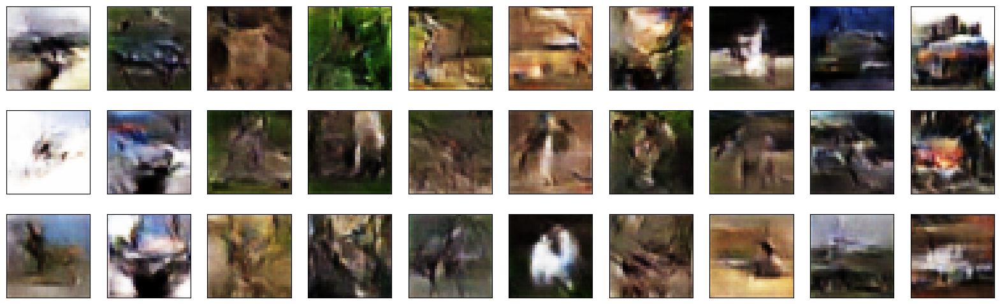

* epoch: 37, d_loss: 592.755546, g_loss: 3213.854484
1/1 [==============================] - 0s 18ms/step


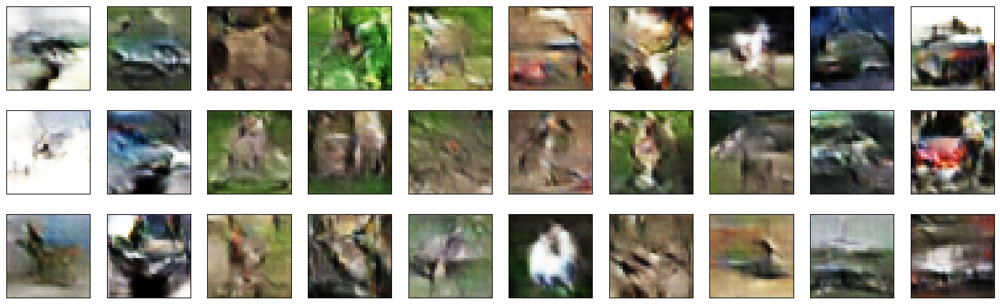

* epoch: 38, d_loss: 560.780301, g_loss: 3403.686951
1/1 [==============================] - 0s 17ms/step


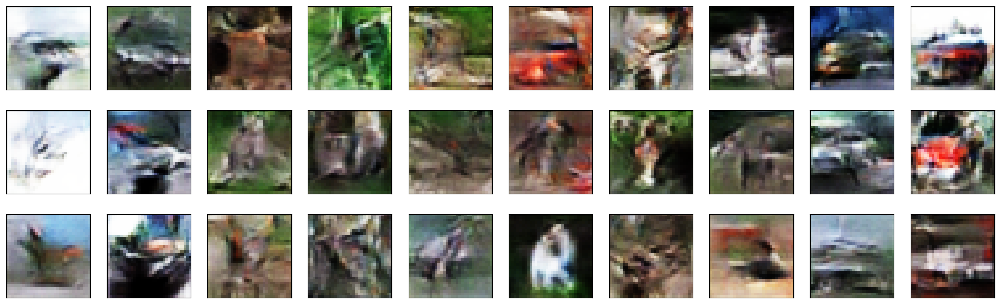

* epoch: 39, d_loss: 566.243602, g_loss: 3361.649451
1/1 [==============================] - 0s 17ms/step


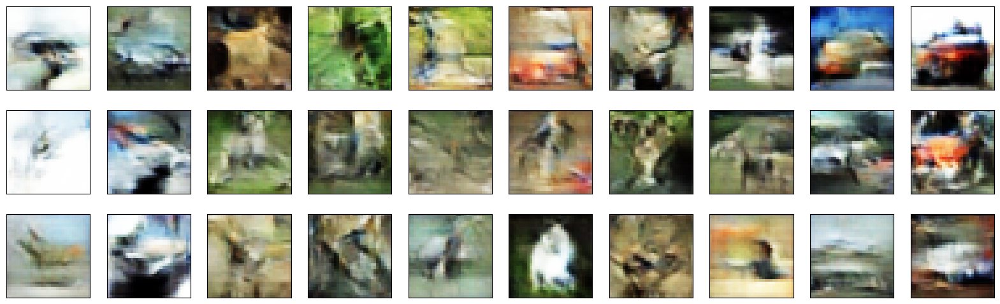

* epoch: 40, d_loss: 541.817284, g_loss: 3509.489674
1/1 [==============================] - 0s 17ms/step


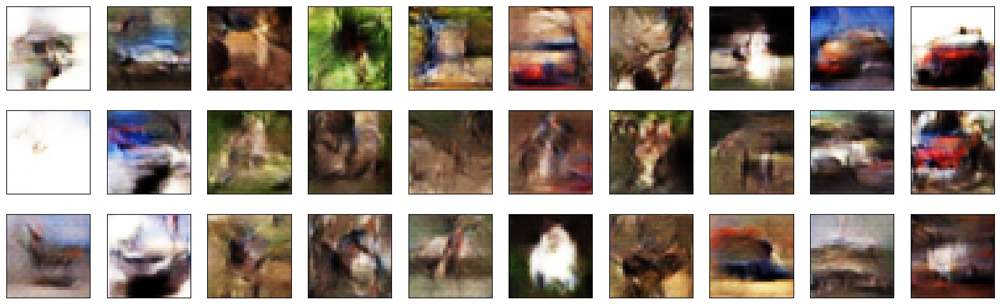

* epoch: 41, d_loss: 567.719837, g_loss: 3388.674679
1/1 [==============================] - 0s 15ms/step


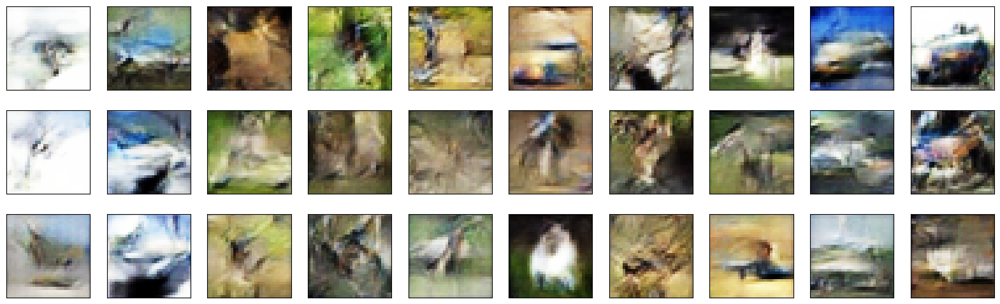

* epoch: 42, d_loss: 574.196399, g_loss: 3302.694793
1/1 [==============================] - 0s 15ms/step


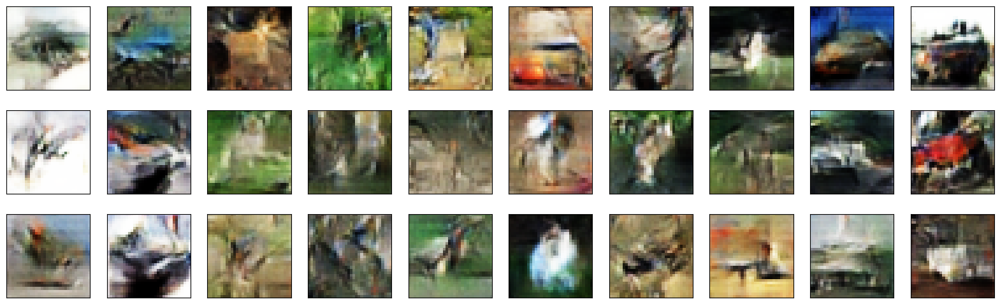

* epoch: 43, d_loss: 556.704758, g_loss: 3483.279708
1/1 [==============================] - 0s 16ms/step


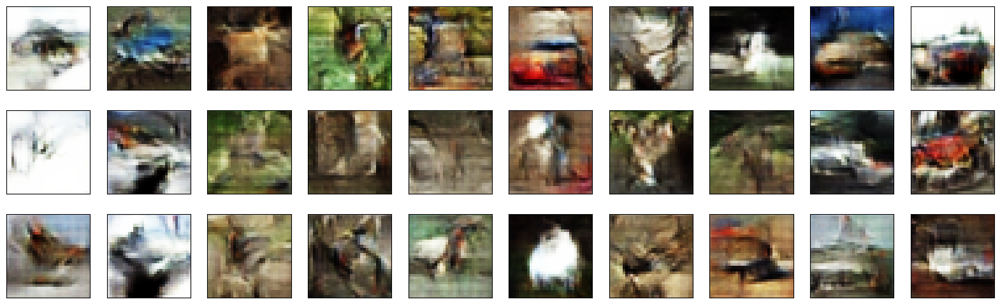

* epoch: 44, d_loss: 555.220286, g_loss: 3485.661186
1/1 [==============================] - 0s 14ms/step


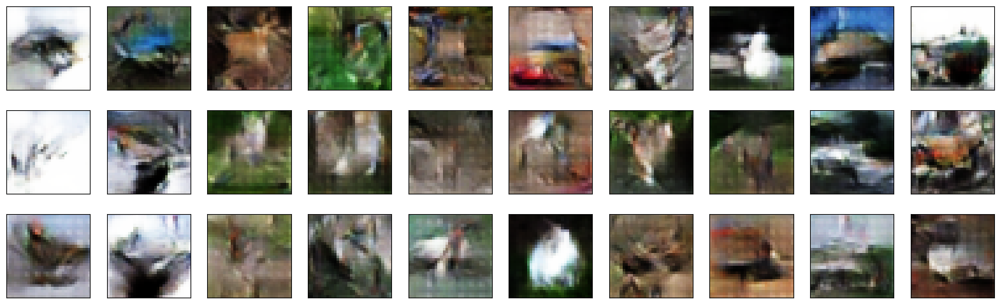

* epoch: 45, d_loss: 566.083762, g_loss: 3402.367531
1/1 [==============================] - 0s 13ms/step


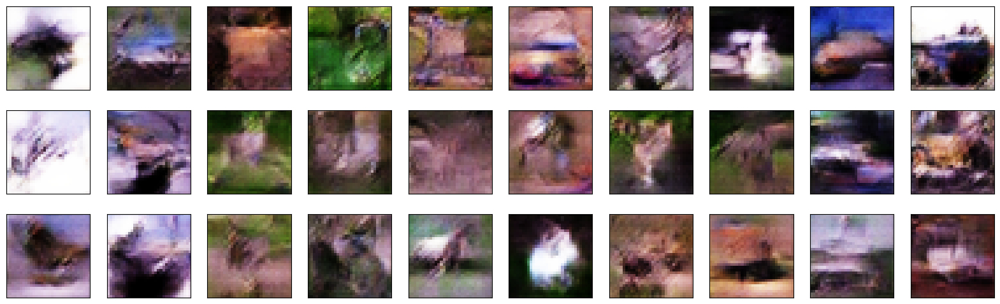

* epoch: 46, d_loss: 546.738311, g_loss: 3551.699483
1/1 [==============================] - 0s 14ms/step


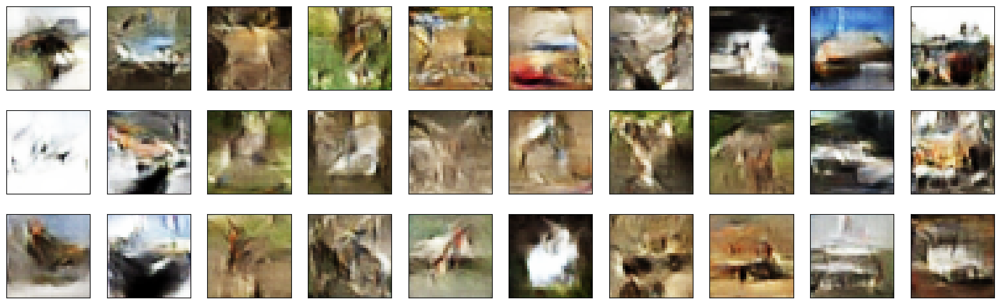

* epoch: 47, d_loss: 562.555839, g_loss: 3479.488450
1/1 [==============================] - 0s 22ms/step


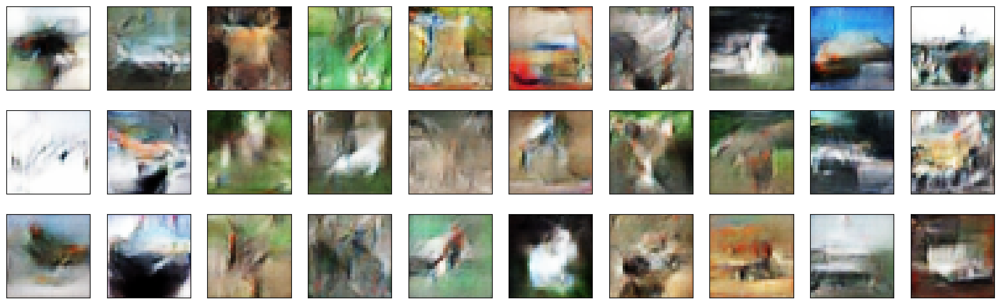

* epoch: 48, d_loss: 537.793494, g_loss: 3666.189103
1/1 [==============================] - 0s 17ms/step


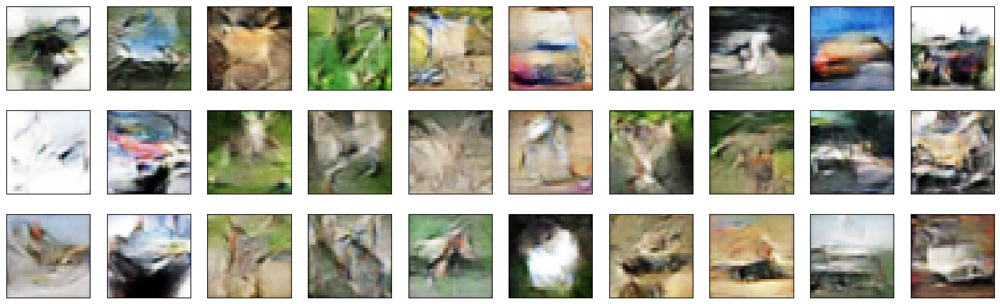

* epoch: 49, d_loss: 537.839311, g_loss: 3695.086643
1/1 [==============================] - 0s 14ms/step


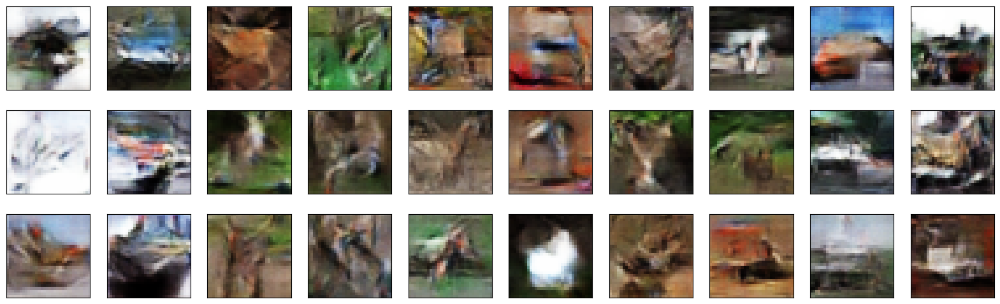

* epoch: 50, d_loss: 562.293369, g_loss: 3469.430291
1/1 [==============================] - 0s 16ms/step


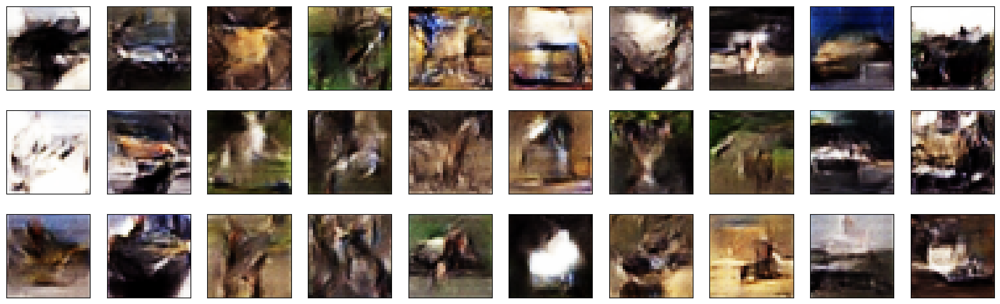

* epoch: 51, d_loss: 563.968639, g_loss: 3508.789392
1/1 [==============================] - 0s 17ms/step


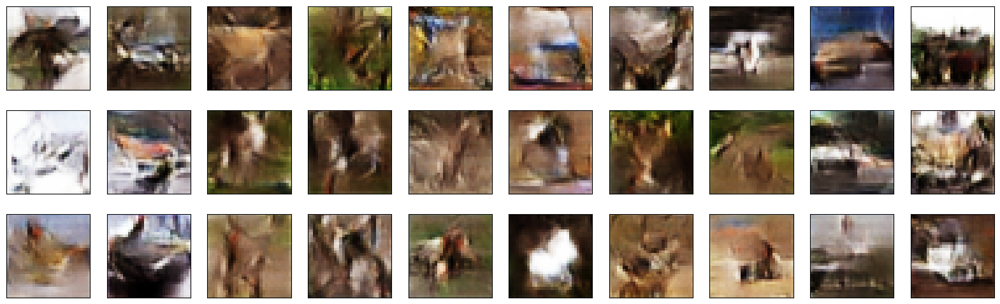

* epoch: 52, d_loss: 565.583832, g_loss: 3426.583056
1/1 [==============================] - 0s 14ms/step


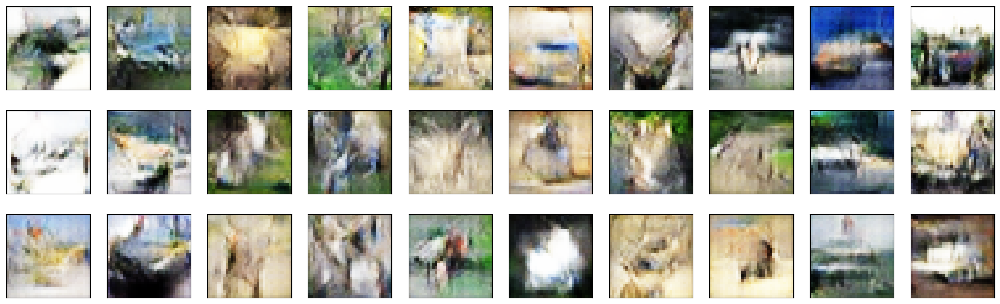

* epoch: 53, d_loss: 569.564862, g_loss: 3453.976147
1/1 [==============================] - 0s 15ms/step


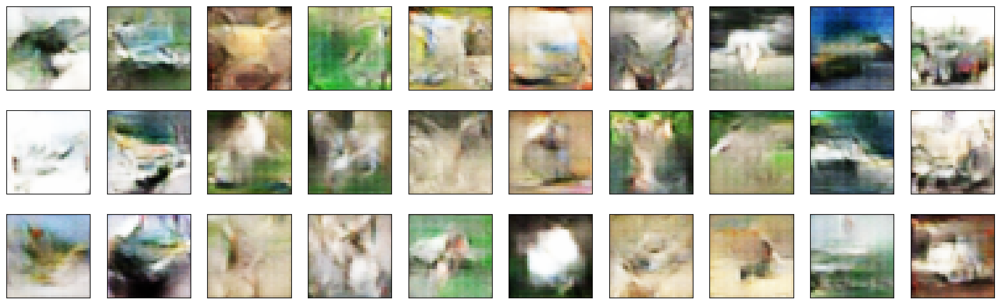

* epoch: 54, d_loss: 569.362288, g_loss: 3457.828322
1/1 [==============================] - 0s 15ms/step


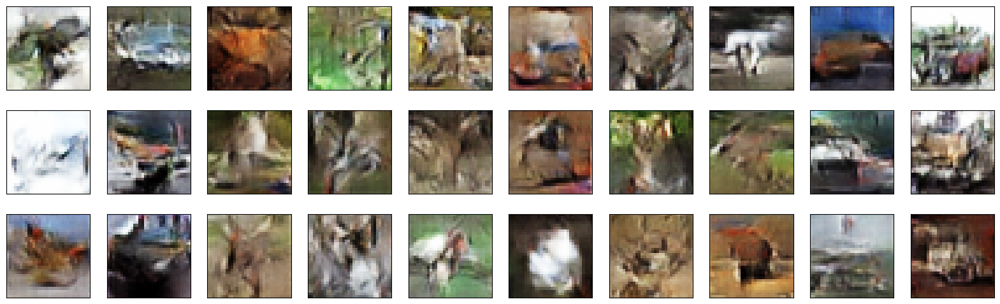

* epoch: 55, d_loss: 543.515514, g_loss: 3647.458898
1/1 [==============================] - 0s 14ms/step


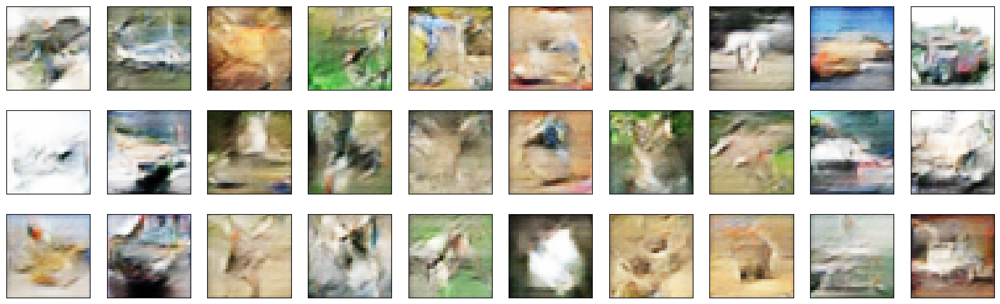

* epoch: 56, d_loss: 556.705855, g_loss: 3504.671558
1/1 [==============================] - 0s 15ms/step


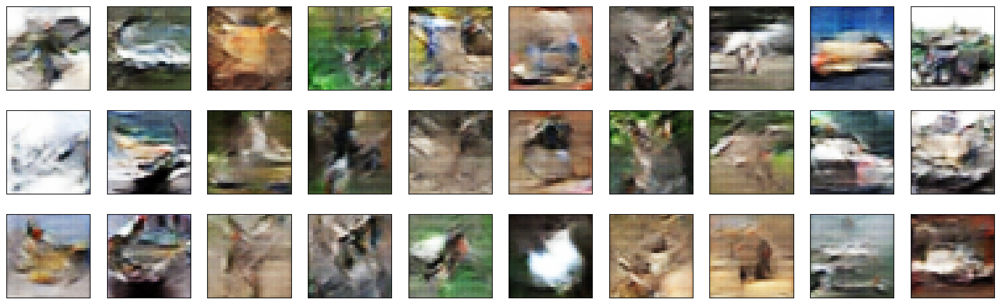

* epoch: 57, d_loss: 585.938658, g_loss: 3402.208241
1/1 [==============================] - 0s 17ms/step


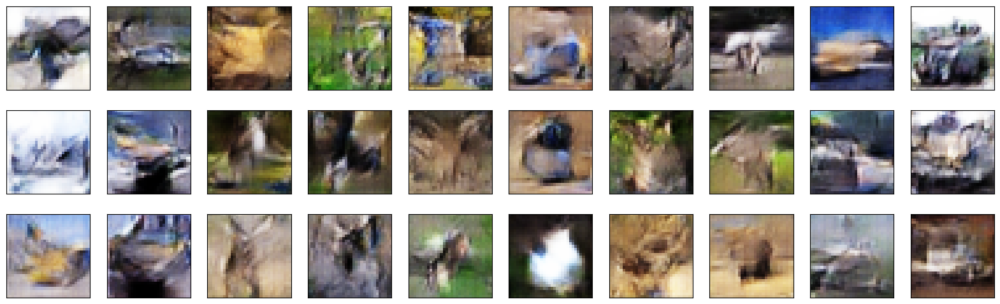

* epoch: 58, d_loss: 561.283024, g_loss: 3507.444246
1/1 [==============================] - 0s 16ms/step


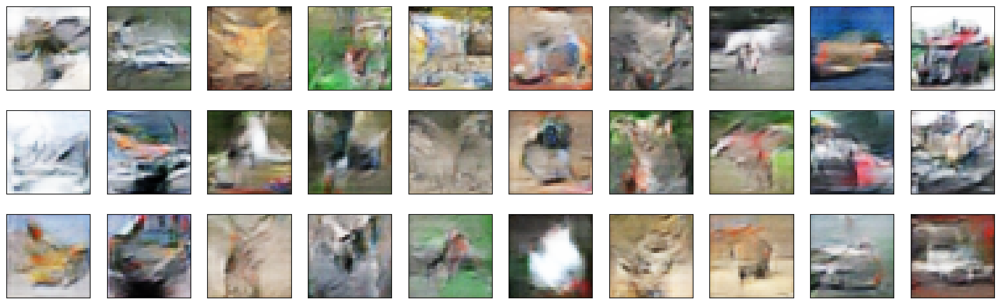

* epoch: 59, d_loss: 583.204388, g_loss: 3410.204867
1/1 [==============================] - 0s 15ms/step


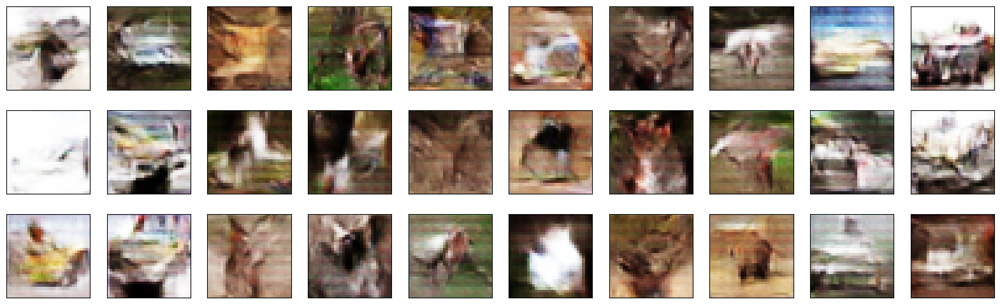

* epoch: 60, d_loss: 548.911545, g_loss: 3601.241198
1/1 [==============================] - 0s 15ms/step


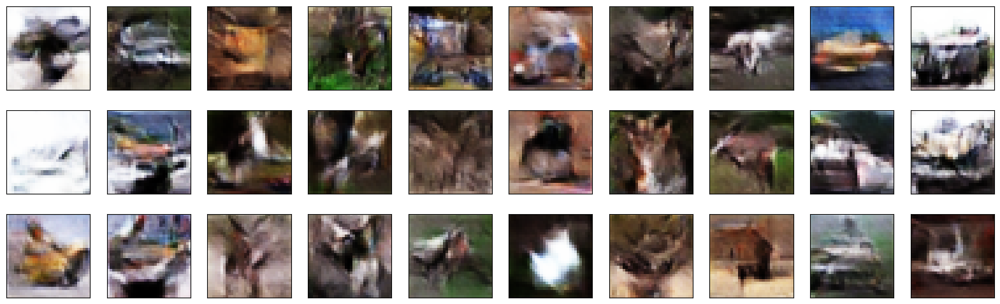

* epoch: 61, d_loss: 616.373448, g_loss: 3228.745577
1/1 [==============================] - 0s 15ms/step


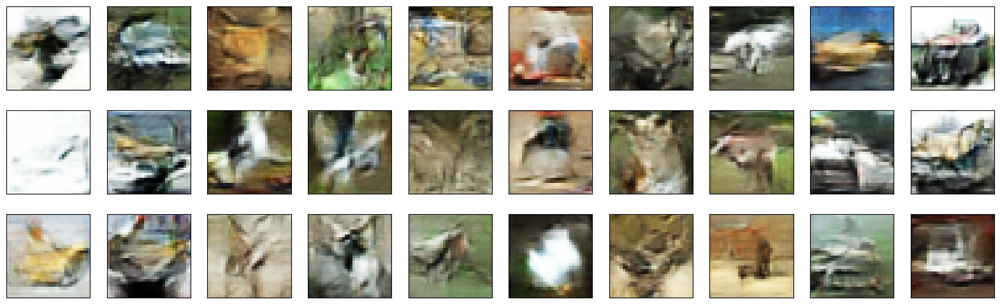

* epoch: 62, d_loss: 575.775822, g_loss: 3474.846921
1/1 [==============================] - 0s 14ms/step


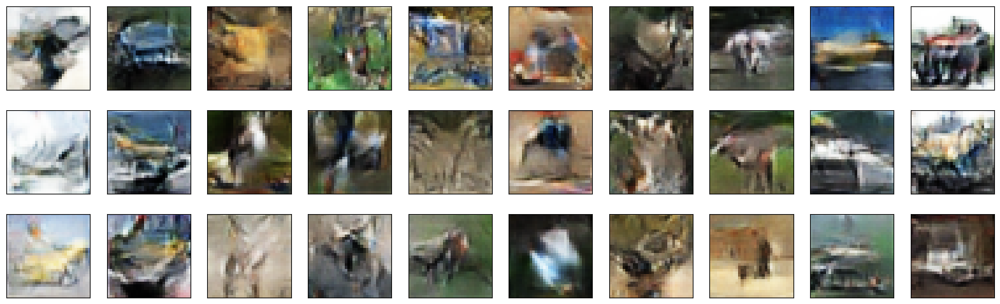

* epoch: 63, d_loss: 580.138094, g_loss: 3476.688129
1/1 [==============================] - 0s 17ms/step


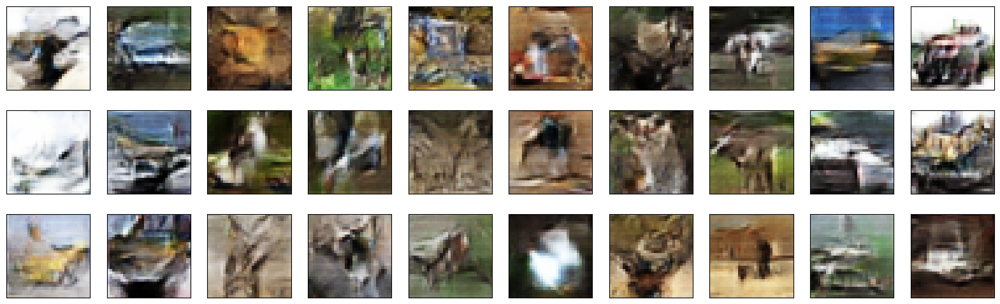

* epoch: 64, d_loss: 582.975725, g_loss: 3427.006545
1/1 [==============================] - 0s 16ms/step


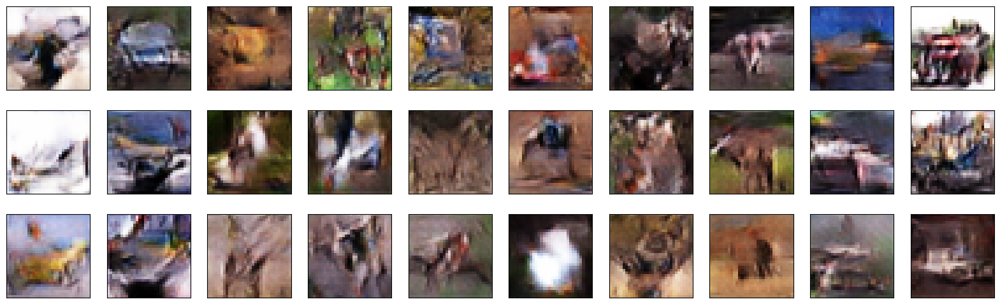

* epoch: 65, d_loss: 599.063730, g_loss: 3326.833572
1/1 [==============================] - 0s 17ms/step


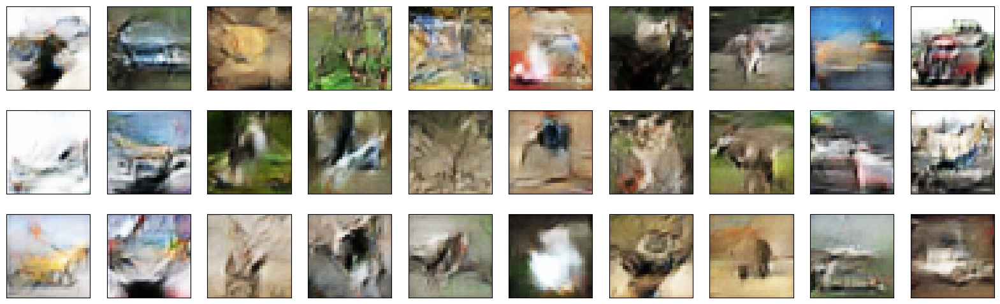

* epoch: 66, d_loss: 933.915446, g_loss: 1824.480678
1/1 [==============================] - 0s 15ms/step


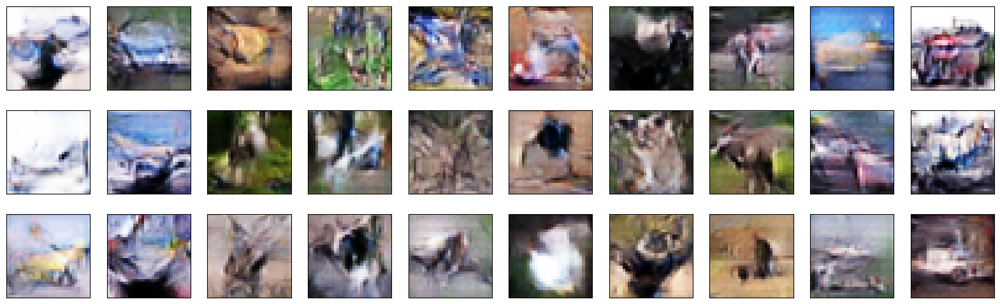

* epoch: 67, d_loss: 1083.828633, g_loss: 1069.034898
1/1 [==============================] - 0s 14ms/step


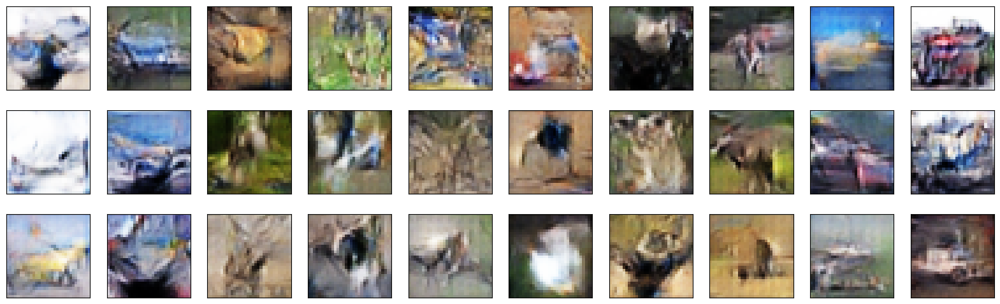

* epoch: 68, d_loss: 1082.724599, g_loss: 1084.517668
1/1 [==============================] - 0s 16ms/step


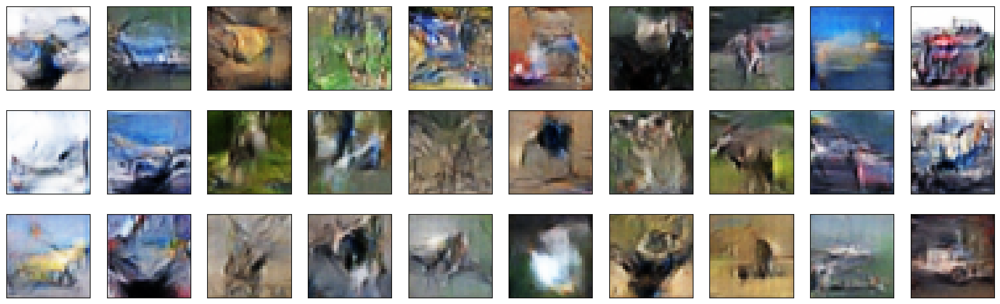

* epoch: 69, d_loss: 1082.812007, g_loss: 1083.603080
1/1 [==============================] - 0s 15ms/step


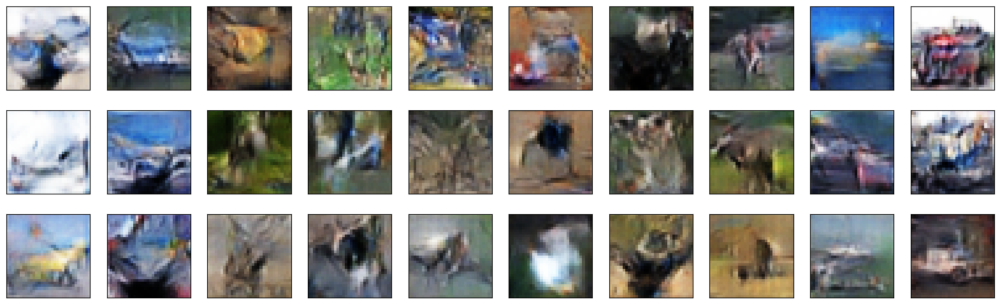

* epoch: 70, d_loss: 1088.326076, g_loss: 1083.021925
1/1 [==============================] - 0s 22ms/step


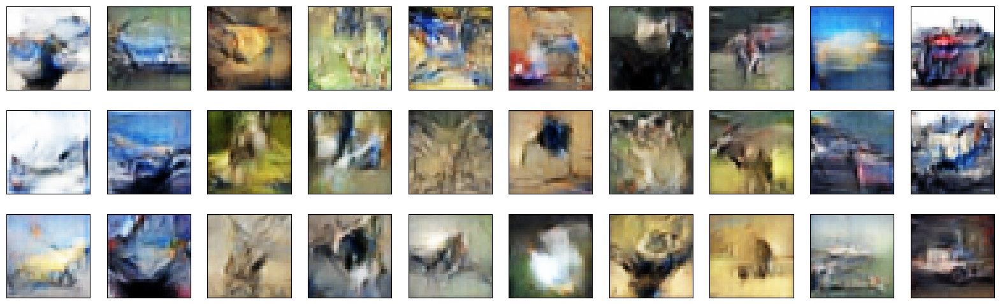

In [22]:
model = GAN(gene, disc, IMG_SHAPE, NOISE_DIM,LABEL_DIM)
model.Compile()
model.gan.summary()
model.fit(x_train,y_data=y_train,  epochs= 70, standard=True)

## BEGAN